<a href="https://colab.research.google.com/github/fener95/GEE-bugisu-project/blob/main/FrictionSurface_100m_Bugisu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [1]:
import ee
# Trigger the authentication flow.
ee.Authenticate(auth_mode= 'notebook',  #force =True,
                #scopes='https://www.googleapis.com/auth/earthengine'
                )
ee.Initialize(project='takehome-exam-bugisu-project')
import geemap

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/cloud-platform%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=mMx806gSMOR0IaPOfCqex-ILi5Bk4B1PorvDslewPCQ&tc=ZI25Yl4y-c3jpCbvAPFoqIwDJ_0UwKEE5IB-9hcUiNw&cc=mXb_0hZ-S4XXJnYUzUvp7cYbWtZlJnuUd2a8t4yExBI

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AcvDMrDl795pe2N1CGz7k8TthhQNOG1Nv8K4gzuB74dkpezTEA2N22Cl3bA

Successfully saved authorization token.


In [36]:
Map = geemap.Map()
#feature collections assets import
# region from my asset in gee for the bugisu (Elgon)subregion (made up of 8 districts around Mt Elgon)
region = ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/bugisu_subRegion')
geometry = region.geometry()

# Add FC assets of streets type as retrieved here:

[hotosm_uganda_east_roads](https://data.humdata.org/dataset/hotosm_uga_east_roads)

json file of shp file: {
    "created": "2022-01-14T00:11:21.994723",
    "description": "ESRI Shapefile",
    "format": "SHP",
    "download_url": "https://export.hotosm.org/downloads/3e9bbf66-c80c-4118-a998-04edc1a8cde9/hotosm_uga_east_roads_lines_shp.zip",
    "id": "7d97c421-9f38-495d-8d0e-a1e735d634b2",
    "last_modified": "2022-01-14T00:14:03.177745",
    "metadata_modified": "2024-01-26T15:53:06.342021",
    "microdata": false,
    "dataset_id": "9dd6b42b-ff7d-4b1a-818a-3b5b0d6a8b86",
    "resource_type": "api",
    "name": "hotosm_uga_east_roads_lines_shp.zip",
    "mimetype": null,
    "size": "0.0B"
}

# Conversion from a 'speed' to a 'cost' of time to traverse 1m

In [3]:
########### cost = time =  minutes to traverse one meter

# Define the function to convert speed in km/h to time in minutes to traverse one meter
def convert_speed_to_time(image):
  # The conversion factor as per the formula
  conversion_factor = 16.6667

   # Apply the conversion
  transformed_image = image.expression(
      '(1 / (speed * factor))',
       {
          'speed': image.select('km/h'),
          'factor': conversion_factor
      }
  ).multiply(1000).float()


  # Rename
  time_image = transformed_image.toFloat().rename('minutes_per_meter')

  return time_image

In [4]:
#here is applied the func above to make a cost surface;
# then, it creates one image per each of the streets types
#then, set the speed as a new property from the lookup table 'speed_values'

def create_speed_image(collection, speed_value, crs='EPSG:4326', scale=100):
    def set_speed(feat):
        return feat.set('speed', speed_value)

    road_pre_img = collection.map(set_speed)
    fc_img0 = road_pre_img.reduceToImage(['speed'], ee.Reducer.first()).reproject(crs=crs, scale=scale)
    fc_img1 = fc_img0.select('first').toFloat().rename('km/h')
    fc_img = convert_speed_to_time(fc_img1)    # to go back to km/h just delete this line and return fc_img1
    return fc_img

# Define the feature collections and their respective speed values
highway_collections = {
    'road': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_road'),
    'path': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_path'),
    'tertiary': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_tertiary'),
    'residential': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_residential'),
    'track': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_track'),
    'service': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_service'),
    'unclassified': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_unclassified'),
    'primary': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_primary'),
    'footway': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_footway'),
    'secondary': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_secondary'),
    'rural': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_rural'),
    'living_street': ee.FeatureCollection('projects/takehome-exam-bugisu-project/assets/highways_living_street')
}

speed_values = {
    'road': 50.00,
    'path': 20.00,
    'tertiary': 50.00,
    'residential': 50.00,
    'track': 30.00,
    'service': 20.00,
    'unclassified': 50.00,
    'primary': 80.00,
    'footway': 20.00,
    'secondary': 50.00,
    'rural': 40.00,
    'living_street': 20.00
}

# Create images for each feature collection with the respective speed values
speed_images = {}
for highway_type, collection in highway_collections.items():
    speed_value = speed_values[highway_type]
    speed_images[highway_type] = create_speed_image(collection, speed_value)


#Step_I Land Cover raster 100m AND elevation 100m

In [5]:
# an elevation image with slope at 100m
dataset = ee.Image('CGIAR/SRTM90_V4');
elevation = dataset.select('elevation');
slope = ee.Terrain.slope(elevation);

In [6]:
# land cover dataset at 100m from the catalog in GEE

LC = ee.Image('COPERNICUS/Landcover/100m/Proba-V-C3/Global/2019').select(
  'discrete_classification').clip(geometry)

## Create elevation and slope layers of the adjustment factors and map them as images

In [8]:
#elevation_factor = 1.016 * math.exp(-0.0001072 * 1000)
#slope_factor = (6 * math.exp(-3.5 * (math.tan(0.01745 * 30) + 0.05))) / 5.0

In [9]:
#reprojected_dem  # the elevation at 100m sp res
reprojected_dem = elevation.reproject(crs='EPSG:4326', scale=100)
slope_re = ee.Terrain.slope(reprojected_dem)

[Source:adjustment_factors_walkingSpeed](https://www.nature.com/articles/nature25181)

"A global map of travel time to cities to assess inequalities in accessibility in 2015", Weiss D J, Nelson A, et al.

In [10]:
# Define the function to compute the elevation factor
def compute_elevation_factor(image):
    elevation_factor = image.expression(
        '1.016 * exp(-0.0001072 * elevation)',
        {
            'elevation': image
        }
    ).rename('elevation_factor')
    return elevation_factor

# Compute the elevation factor
elevation_factor = compute_elevation_factor(reprojected_dem)

# Add the elevation factor band to the original image
elev_correction = dataset.addBands(elevation_factor)

# Define visualization parameters for the elevation factor
viz_params1 = {
    'bands': ['elevation_factor'],
    'min': 0.5,
    'max': 1.0,
    'palette': ['blue', 'green', 'red']
}

In [11]:
# Define the function to compute the slope factor
def compute_slope_factor(slope_image):
    slope_factor = slope_image.expression(
        '(6 * exp(-3.5 * (tan(0.01745 * slope) + 0.05))) / 5.0',
        {
            'slope': slope_image
        }
    ).rename('slope_factor')
    return slope_factor

# Compute the slope factor
slope_factor = compute_slope_factor(slope_re)

# Add the slope factor band to the original image
slope_correction = dataset.addBands(slope_factor)

# Define visualization parameters for the slope factor
viz_params2 = {
    'bands': ['slope_factor'],
    'min': 0.0,
    'max': 1.0,
    'palette': ['blue', 'green', 'red']
}

Speed (km/h) Values as those used in https://www.nature.com/articles/nature25181  per LandCover(Method/Accessibility_mapping_methodology)

In [12]:
lookup_table = {
    0: 0.0,      # Unknown
    20: 3.00,    # Shrubs
    30: 4.86,    # Herbaceous vegetation
    40: 2.50,    # Cultivated and managed vegetation/agriculture
    50: 5.00,    # Urban/built up (assumed slower travel speed)
    60: 3.00,    # Bare/sparse vegetation
    70: 1.62,    # Snow and ice
    80: 0.0,     # Permanent water bodies (no travel possible)
    90: 2.00,    # Herbaceous wetland
    100: 1.62,   # Moss and lichen (assumed slower travel speed)
    111: 3.24,   # Closed forest, evergreen needle leaf
    112: 1.62,   # Closed forest, evergreen broadleaf
    113: 3.24,   # Closed forest, deciduous needleleaf
    114: 4.00,   # Closed forest, deciduous broadleaf
    115: 3.24,   # Closed forest, mixed
    116: 3.24,   # Closed forest, not matching any of the other definitions (assumed mixed)
    121: 3.24,   # Open forest, evergreen needleleaf
    122: 1.62,   # Open forest, evergreen broadleaf
    123: 3.24,   # Open forest, deciduous needleleaf
    124: 4.00,   # Open forest, deciduous broadleaf
    125: 3.00,   # Open forest, mixed
    126: 3.24,   # Open forest, not matching any of the other definitions (assumed mixed)
    200: 0.0     # Oceans, seas (no travel possible)
}
#Convert the lookup table to a format that can be used in remap
from_values = list(lookup_table.keys())
to_values = list(lookup_table.values())

In [13]:
#LC reprojected
LC_re = LC.reproject(crs='EPSG:4326', scale=100)

In [14]:
# Create a function to map the values
def apply_lookup_table(image):
    discrete_classification = image.select('discrete_classification')#.toFloat()
    remapped = discrete_classification.remap(from_values, to_values)
    return image.addBands(remapped.rename('speed_classification'))

# Apply the function to the image
speed_cover = apply_lookup_table(LC_re)

speed_cover

# Step III create walking friction surface (without streets)

In [15]:
# Multiply the values from the different bands.
walk_friction = speed_cover.select('speed_classification') \
                           .multiply(elev_correction.select('elevation_factor')) \
                           .multiply(slope_correction.select('slope_factor'))\
                           .toFloat()

# Add the new band to a new image.
walkTime_image = LC_re.addBands(walk_friction.rename('walk_friction'))

# Print the image information to verify.
#print(walkTime_image.getInfo())

In [16]:
# Define visualization parameters for the walk friction layer
vis_params = {
    'bands': ['walk_friction'],
    'min': 0,
    'max': 5,
    'palette': ['000000', '0000FF', '00FFFF', '00FF00', 'FFFF00', 'FF0000']
}

In [17]:
walk_friction_Kmh = walkTime_image.select('walk_friction')

In [19]:
# Calling from speed_images one by one the street types
# 12 streets rasters

road_raster = speed_images['road']
path_raster = speed_images['path']
tertiary_raster = speed_images['tertiary']
residential_raster = speed_images['residential']
track_raster = speed_images['track']
service_raster = speed_images['service']
unclassified_raster = speed_images['unclassified']
primary_raster = speed_images['primary']
footway_raster = speed_images['footway']
secondary_raster = speed_images['secondary']
rural_raster = speed_images['rural']
living_street_raster = speed_images['living_street']

## From walkFrict_km/h to walk_minuter/meter

In [20]:
walk_friction_Kmh

In [21]:
# convert walk_friction from km/h to min/m
def convert_speed_to_time(image):
    # The conversion factor as per the formula
    conversion_factor = 16.6667

     # Apply the conversion with the log transformation
    transformed_image = image.expression(
        '(1 / (speed * factor))',
        {
            'speed': image.select('walk_friction'),
            'factor': conversion_factor
        }
    ).multiply(1000).float()

    # Rename the band for clarity
    time_image = transformed_image.toFloat().rename('minutes_per_meter')

    return time_image


In [22]:
walk_friction_min = convert_speed_to_time(walk_friction_Kmh).toFloat()

In [23]:
walk_friction_min

In [24]:
Map.addLayer(walk_friction_min, {'min': 11, 'max': 1000,
#                                 'palette': ['000000', '0000FF', '00FFFF', '00FF00', 'FFFF00', 'FF0000']
                                 },
             'walk_friction_min',0)

# The friction surface

In [25]:
friction_all = ee.ImageCollection([road_raster, path_raster, tertiary_raster, residential_raster, \
                                   track_raster, service_raster, unclassified_raster, primary_raster, \
                                   footway_raster, secondary_raster, rural_raster, living_street_raster,\
                                   walk_friction_min])
friction_surface = friction_all.reduce(ee.Reducer.min())\
                        .toFloat()\
                        .rename('minute_fraction_per_meter')\
                        .divide(1000)\
                        .clip(geometry)\
                        .reproject(crs='EPSG:4326', scale=100)

In [26]:
vis_frict = {'min': 0.00085,
             'max': 0.3,
             'palette': ['313695', '4575b4', '74add1', 'abd9e9', 'e0f3f8', 'ffffbf', 'fee090',
              'fdae61', 'f46d43', 'd73027', 'a50026', '000000']
             };
#

#palette_beta = ['000000', '0000FF', '00FFFF', '00FF00', 'FFFF00', 'FF0000']



In [27]:
Map.addLayer(friction_surface, vis_frict,\
              'friction_surface')

# Mapping friction surface

In [28]:
Map.centerObject(geometry,9)
Map

Map(center=[1.219457836306686, 34.42505876106456], controls=(WidgetControl(options=['position', 'transparent_b…

# Export to drive

In [29]:
# Set the export "scale" and "crs" parameters.
task = ee.batch.Export.image.toDrive(
    image= friction_surface,
    description='friction_export_Xqgis',
    folder='rasters',
    region=geometry,
    scale=100,
    crs='EPSG:4326',
    maxPixels=1e13
)
#task.start()

In [30]:
#task.status()

# Map with cartoee

In [32]:
!pip install cartopy scipy
import cartopy
from geemap import cartoee
import cartopy.crs as ccrs
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 76.2 MB/s eta 0:00:00


In [33]:
# Draw any shapes on the map using the Drawing tools before executing this code block
#area = Map.user_roi
# Example polygon coordinates
polygon_coords = [
    [34.054871, 0.722332],
    [34.054871, 1.658704],
    [34.859619, 1.658704],
    [34.859619, 0.722332],
    [34.054871, 0.722332]
]

# Create a polygon
polygon = ee.Geometry.Polygon(polygon_coords)

# Compute bounding box
bounds = polygon.bounds()

# Extract coordinates from bounding box
coords = bounds.getInfo()['coordinates'][0]
minLon, minLat = coords[0]
maxLon, maxLat = coords[2]

# Define the rectangle
area = [minLon, minLat, maxLon, maxLat]

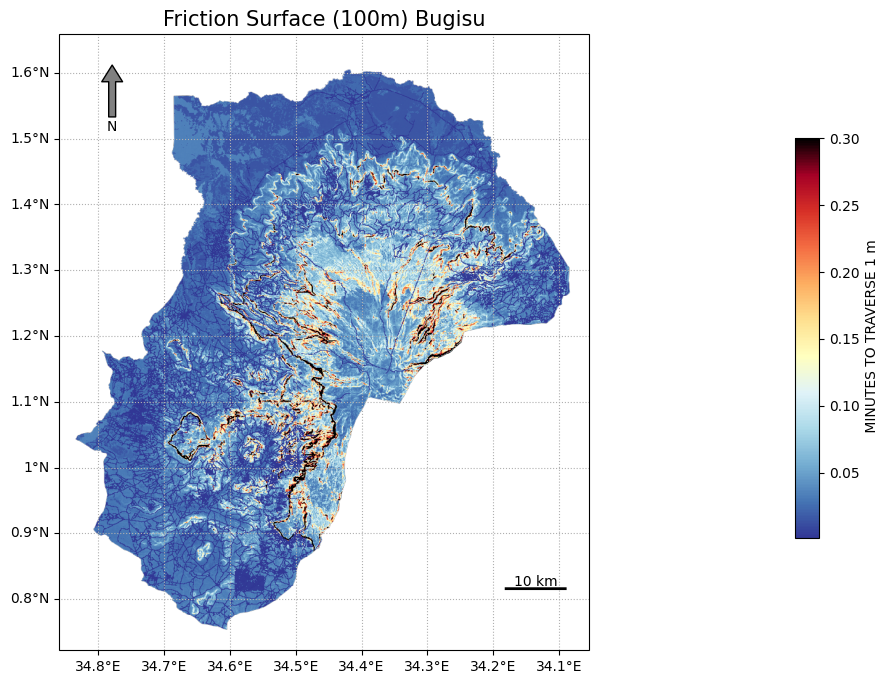

In [34]:
# Create a map using cartoee
fig = plt.figure(figsize=(12, 8))
ax = cartoee.get_map(friction_surface, region=area, vis_params=vis_frict)


# add grid lines to the map at a specified interval
cartoee.add_gridlines(ax, interval=0.1, xtick_rotation=0, linestyle=":")

# title
ax.set_title(label='Friction Surface (100m) Bugisu', fontsize=15)

#cartoee.add_scale_bar_lite(
#    ax, length=10, xy=(0.1, 0.05), fontsize=20, color="black", unit="km"
#)
# add scale bar
scale_bar_dict = {
    "length": 10,
    "xy": (0.10, 0.10),
    "linewidth": 2,
    "fontsize": 10,
    "color": "black",
    "unit": "km",
    "ha": "center",
    "va": "bottom",
}

# add a color bar to the map using the visualization params we passed to the map
cbar = cartoee.add_colorbar(ax, vis_frict, loc="right",
                     label=" MINUTES TO TRAVERSE 1 m",
                     orientation="vertical",
                     )

# add north arrow
cartoee.add_north_arrow(
    ax, text="N", xy=(0.10, 0.95), text_color="black", arrow_color="grey", fontsize=10
)

cartoee.add_scale_bar_lite(ax, **scale_bar_dict)

In [35]:
# save to local
#cartoee.savefig(fig, 'FrictionS_100m_Bugisu.jpg', dpi=300)